In [1]:
# imports

import os
import re
import math
import json
from tqdm import tqdm
import random
from dotenv import load_dotenv
from huggingface_hub import login
import numpy as np
import pickle
from sentence_transformers import SentenceTransformer
from datasets import load_dataset
import chromadb
from items import JobDescription
from sklearn.manifold import TSNE
import plotly.graph_objects as go

In [59]:


from sklearn.manifold import TSNE
import plotly.graph_objects as go

In [3]:
load_dotenv()
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY', 'your-key-if-not-using-env')
os.environ['HF_TOKEN'] = os.getenv('HF_TOKEN', 'your-key-if-not-using-env')
DB = "jobs_vectorstore"

In [4]:

hf_token = os.environ['HF_TOKEN']
login(hf_token, add_to_git_credential=True)

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [11]:
dataset = load_dataset("csv", data_files=r"C:\Users\HP PC\Desktop\llms\llm_engineering\project\job_title_des.csv")

Generating train split: 0 examples [00:00, ? examples/s]

In [15]:
dataset['train'][0]

{'Unnamed: 0': 0,
 'Job Title': 'Flutter Developer',
 'Job Description': 'We are looking for hire experts flutter developer. So you are eligible this post then apply your resume.\nJob Types: Full-time, Part-time\nSalary: ₹20,000.00 - ₹40,000.00 per month\nBenefits:\nFlexible schedule\nFood allowance\nSchedule:\nDay shift\nSupplemental Pay:\nJoining bonus\nOvertime pay\nExperience:\ntotal work: 1 year (Preferred)\nHousing rent subsidy:\nYes\nIndustry:\nSoftware Development\nWork Remotely:\nTemporarily due to COVID-19'}

In [39]:
train = dataset['train'].remove_columns('Unnamed: 0')

In [16]:
client = chromadb.PersistentClient(path=DB)

In [17]:
collection_name = "Job_desc"
existing_collection_names = [collection.name for collection in client.list_collections()]
if collection_name in existing_collection_names:
    client.delete_collection(collection_name)
    print(f"Deleted existing collection: {collection_name}")

collection = client.create_collection(collection_name)

In [18]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

In [40]:
SKILL_KEYWORDS = [
    "Python", "Django", "Flutter", "React", "Machine Learning", "iOS", "Android", "SQL", "JavaScript", "AWS"
]

# Function to extract skills from the Job Description
def extract_skills(description: str, skill_keywords: list) -> str:
    """
    Extract relevant skills from the job description by matching predefined skill keywords.
    """
    skills = [skill for skill in skill_keywords if skill.lower() in description.lower()]
    return ", ".join(skills) if skills else "Not specified"

# Function to extract location (example regex for cities)
def extract_location(description: str) -> str:
    """
    Extract location information from the job description.
    """
    match = re.search(r"\b(?:Bangalore|San Francisco|Remote|New York|London|Sydney)\b", description, re.IGNORECASE)
    return match.group() if match else "Unknown"

# Function to process the dataset
def process_jobs(dataset):
    processed_jobs = []
    for item in dataset:
        processed_jobs.append({
            "job_title": item['Job Title'],
            "category": "General",  # Default category
            "skills": extract_skills(item['Job Description'], SKILL_KEYWORDS),
            "location": extract_location(item['Job Description']),
        })
    return processed_jobs

# Load your dataset (replace with your CSV file path)





In [42]:
# Process the dataset
processed_jobs = process_jobs(train)



In [43]:
processed_jobs

[{'job_title': 'Flutter Developer',
  'category': 'General',
  'skills': 'Flutter',
  'location': 'Unknown'},
 {'job_title': 'Django Developer',
  'category': 'General',
  'skills': 'Python, Django, SQL',
  'location': 'Unknown'},
 {'job_title': 'Machine Learning',
  'category': 'General',
  'skills': 'Python, Machine Learning',
  'location': 'Bangalore'},
 {'job_title': 'iOS Developer',
  'category': 'General',
  'skills': 'iOS',
  'location': 'Unknown'},
 {'job_title': 'Full Stack Developer',
  'category': 'General',
  'skills': 'React, JavaScript',
  'location': 'Unknown'},
 {'job_title': 'Java Developer',
  'category': 'General',
  'skills': 'React, SQL',
  'location': 'Unknown'},
 {'job_title': 'Full Stack Developer',
  'category': 'General',
  'skills': 'React, SQL, JavaScript',
  'location': 'Unknown'},
 {'job_title': 'JavaScript Developer',
  'category': 'General',
  'skills': 'React, JavaScript',
  'location': 'Unknown'},
 {'job_title': 'DevOps Engineer',
  'category': 'Genera

In [56]:
def description(item):
    if not isinstance(item, dict):
        raise TypeError(f"Unexpected item format: {item}")
    return f"{item['Job Title']}: {item['Job Description']}"


In [55]:
description(train[0])+'\n'+'***********************************************'+description(train[0])

'Flutter Developer: We are looking for hire experts flutter developer. So you are eligible this post then apply your resume.\nJob Types: Full-time, Part-time\nSalary: ₹20,000.00 - ₹40,000.00 per month\nBenefits:\nFlexible schedule\nFood allowance\nSchedule:\nDay shift\nSupplemental Pay:\nJoining bonus\nOvertime pay\nExperience:\ntotal work: 1 year (Preferred)\nHousing rent subsidy:\nYes\nIndustry:\nSoftware Development\nWork Remotely:\nTemporarily due to COVID-19\n***********************************************Flutter Developer: We are looking for hire experts flutter developer. So you are eligible this post then apply your resume.\nJob Types: Full-time, Part-time\nSalary: ₹20,000.00 - ₹40,000.00 per month\nBenefits:\nFlexible schedule\nFood allowance\nSchedule:\nDay shift\nSupplemental Pay:\nJoining bonus\nOvertime pay\nExperience:\ntotal work: 1 year (Preferred)\nHousing rent subsidy:\nYes\nIndustry:\nSoftware Development\nWork Remotely:\nTemporarily due to COVID-19'

In [58]:
# Process in batches
for i in tqdm(range(0, len(train), 1000)):  # Process in batches of 1000
    # Use select for proper slicing
    batch = train.select(range(i, min(i + 1000, len(train))))

    # Generate documents by processing the job data
    documents = [description(item) for item in batch]
    
    # Generate embeddings for the documents
    vectors = model.encode(documents).astype(float).tolist()
    
    # Create metadata for each job description
    metadatas = [
        {
            "job_title": item['Job Title'],
            "category": item.get('Category', 'General'),  # Use a default category if none is provided
            "skills": item.get('Skills', 'Not specified'),  # Optional skill field
            "location": item.get('Location', 'Unknown')  # Add more fields as needed
        }
        for item in batch
    ]
    
    # Create unique IDs for each document
    ids = [f"doc_{j}" for j in range(i, i+len(batch))]
    
    # Add data to the collection
    collection.add(
        ids=ids,
        documents=documents,  # Raw text descriptions
        embeddings=vectors,   # Encoded embeddings
        metadatas=metadatas   # Metadata for each description
    )

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [05:07<00:00, 102.66s/it]


In [30]:
df=pd.read_csv(r"C:\Users\HP PC\Desktop\llms\llm_engineering\project\job_title_des.csv")

In [31]:
df.head()

,Unnamed: 0,Job Title,Job Description
0,0,Flutter Developer,We are looking for hire experts flutter develo...
1,1,Django Developer,PYTHON/DJANGO (Developer/Lead) - Job Code(PDJ ...
2,2,Machine Learning,"Data Scientist (Contractor)\n\nBangalore, IN\n..."
3,3,iOS Developer,JOB DESCRIPTION:\n\nStrong framework outside o...
4,4,Full Stack Developer,job responsibility full stack engineer – react...


In [60]:
DB = "jobs_vectorstore"
client = chromadb.PersistentClient(path=DB)
collection = client.get_or_create_collection('Job_desc')

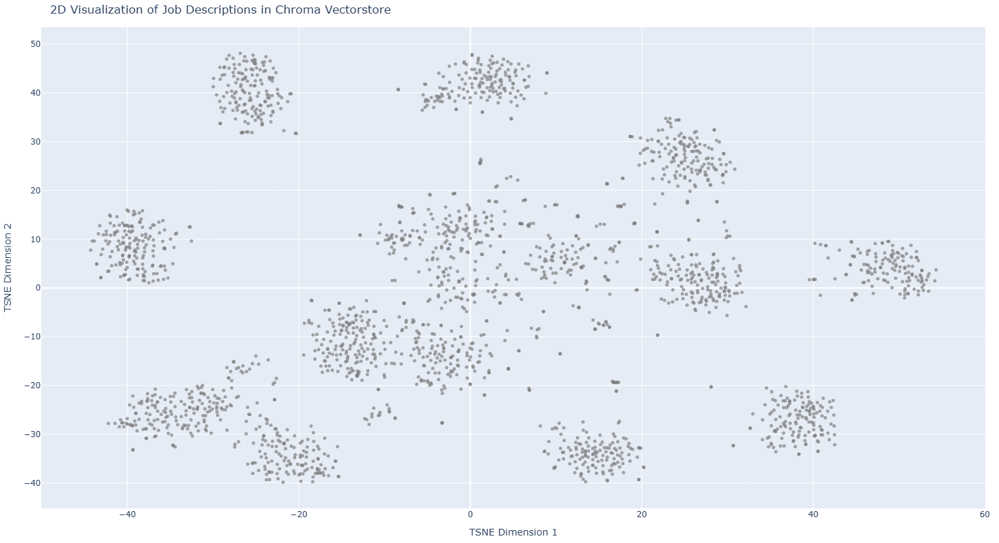

In [62]:
import numpy as np
from sklearn.manifold import TSNE
import plotly.graph_objects as go
MAXIMUM_DATAPOINTS = 10_000
# Define job-related categories and corresponding colors
CATEGORIES = ['Software Development', 'Data Science', 'Mobile Development', 'Web Development', 
              'DevOps', 'Management', 'UI/UX Design', 'Other']
COLORS = ['blue', 'green', 'red', 'purple', 'orange', 'yellow', 'brown', 'gray']

# Fetch data from Chroma collection
result = collection.get(include=['embeddings', 'documents', 'metadatas'], limit=MAXIMUM_DATAPOINTS)
vectors = np.array(result['embeddings'])  # Embeddings of job descriptions
documents = result['documents']          # Job descriptions
categories = [metadata.get('category', 'Other') for metadata in result['metadatas']]  # Job categories
colors = [COLORS[CATEGORIES.index(c)] if c in CATEGORIES else 'gray' for c in categories]  # Assign colors

# Reduce embeddings to 2D for visualization
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
reduced_vectors = tsne.fit_transform(vectors)

# Create the 2D scatter plot
fig = go.Figure(data=[go.Scatter(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    mode='markers',
    marker=dict(size=5, color=colors, opacity=0.7),
    text=documents  # Tooltip with the job description
)])

# Update plot layout
fig.update_layout(
    title='2D Visualization of Job Descriptions in Chroma Vectorstore',
    xaxis_title='TSNE Dimension 1',
    yaxis_title='TSNE Dimension 2',
    width=1200,
    height=800,
    margin=dict(r=20, b=10, l=10, t=40),
    showlegend=False
)

# Show the plot
fig.show()


In [ ]:
from agents.scanner import ScannerAgent
